# SIMVI tutorial on MERFISH MTG data

In this tutorial, we illustrate the usage of SIMVI, and apply it to reproduce analysis result for MERFISH MTG data in Figs. 2-3 of the manuscript.

## Import packages

In [1]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

## Import and preprocess datasets

In [2]:
adata1 = sc.read_h5ad('datasets/merfish/H18.06.006.MTG.4000.expand.rep1.h5ad')
adata2 = sc.read_h5ad('datasets/merfish/H18.06.006.MTG.4000.expand.rep2.h5ad')
adata3 = sc.read_h5ad('datasets/merfish/H18.06.006.MTG.4000.expand.rep3.h5ad')
adata1.obs['batch'] = 'H18.06.006.MTG.4000.rep1'
adata2.obs['batch'] = 'H18.06.006.MTG.4000.rep2'
adata3.obs['batch'] = 'H18.06.006.MTG.4000.rep3'

adata1.obs['coord'] = adata1.obsm['spatial'][:,1]
adata1.obs['niche'] = 'N1'
adata1.obs['niche'][adata1.obs['coord']> -1500] = 'N2'
adata1.obs['niche'][adata1.obs['coord']> -1000] = 'N3'
adata1.obs['niche'][adata1.obs['coord']> -200] = 'N4'
adata1.obs['niche'][adata1.obs['coord']> 350] = 'N5'

adata2.obs['coord'] = np.sqrt((adata2.obsm['spatial'][:,0]+3000) ** 2 + (adata2.obsm['spatial'][:,1]-400) ** 2)
adata2.obs['niche'] = 'N6'
adata2.obs['niche'][adata2.obs['coord']> 2100] = 'N5'
adata2.obs['niche'][adata2.obs['coord']> 3600] = 'N4'

adata3.obs['coord'] = np.sqrt((adata3.obsm['spatial'][:,0]-3000) ** 2 + (adata3.obsm['spatial'][:,1]-1300) ** 2)
adata3.obs['niche'] = 'N6'
adata3.obs['niche'][adata3.obs['coord']> 2000] = 'N5'
adata3.obs['niche'][adata3.obs['coord']> 3900] = 'N4'
adata3.obs['niche'][adata3.obs['coord']> 4350] = 'N3'
adata3.obs['niche'][adata3.obs['coord']> 5600] = 'N2'
adata3.obs['niche'][adata3.obs['coord']> 6000] = 'N1'

adata_mtg = sc.concat([adata1,adata2,adata3])
adata_mtg.obs_names_make_unique()
adata_mtg

/tmp/ipykernel_92204/3933570242.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata1.obs['niche'][adata1.obs['coord']> -1500] = 'N2'
/tmp/ipykernel_92204/3933570242.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata1.obs['niche'][adata1.obs['coord']> -1000] = 'N3'
/tmp/ipykernel_92204/3933570242.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata1.obs['niche'][adata1.obs['coord']> -200] = 'N4'
/tmp/ipykernel_92204

AnnData object with n_obs × n_vars = 11059 × 4000
    obs: 'name', 'global.x', 'global.y', 'adjusted.x', 'adjusted.y', 'fov.x', 'fov.y', 'cluster_L1', 'cluster_L2', 'cluster_L3', 'batch', 'coord', 'niche'
    obsm: 'spatial'

## Run SIMVI model

In [3]:
from simvi.model import SimVI
SimVI.setup_anndata(adata_mtg,batch_key='batch')
edge_index = SimVI.extract_edge_index(adata_mtg,n_neighbors=10,batch_key='batch')
from pytorch_lightning.utilities.seed import seed_everything
seed_everything(0)
model = SimVI(adata_mtg,kl_weight=1,kl_gatweight=0.01,lam_mi=1000,permutation_rate=0.5,n_spatial=20,n_intrinsic=20)
train_loss, val_loss = model.train(edge_index,max_epochs=100,batch_size=500,use_gpu=True,mae_epochs=25)
adata_mtg.obsm['simvi_z'] = model.get_latent_representation(edge_index,representation_kind='intrinsic',give_mean=True)
adata_mtg.obsm['simvi_s'] = model.get_latent_representation(edge_index,representation_kind='interaction',give_mean=True)

Global seed set to 0
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
Global seed set to 0
Epoch 100/100: 100%|███████████████████████| 100/100 [06:01<00:00,  3.61s/it, train_loss=1.43e+3, val_loss=1434.5796]


We next visualize the intrinsic and spatial variations generated from SIMVI. In the step of visualizing SIMVI spatial variation, we log normalized and visualized the expression of MYH11.

2024-10-23 00:34:31.304573: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


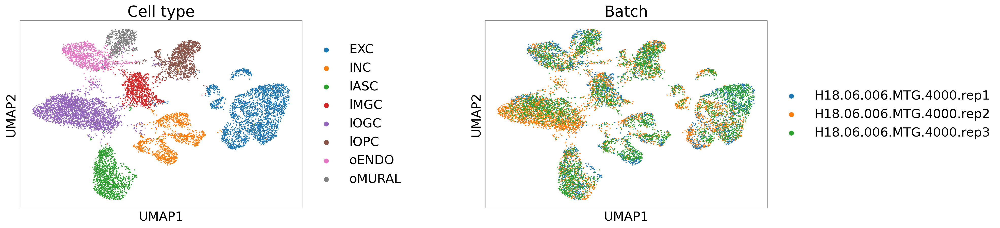

In [4]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18
adata_mtg.uns['niche_colors'] = ['#c7e9b4','#7fcdbb','#41b6c4','#2c7fb8','#253494','#081d58']
sc.pp.neighbors(adata_mtg,use_rep='simvi_z')
sc.tl.umap(adata_mtg)
sc.pl.umap(adata_mtg,color=['cluster_L1','batch'],title=['Cell type','Batch'],cmap='Oranges',vmax='p99.5',wspace=0.5)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


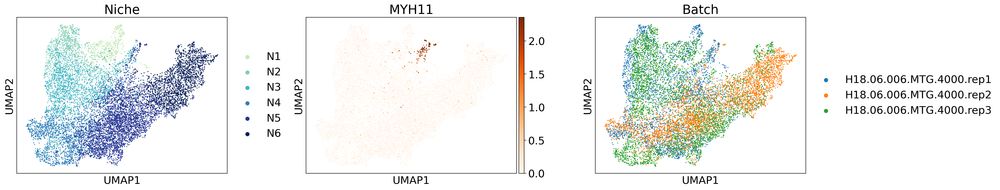

In [ ]:
sc.pp.normalize_total(adata_mtg)
sc.pp.log1p(adata_mtg)
import matplotlib.pyplot as plt

sc.pp.neighbors(adata_mtg,use_rep='simvi_s')
sc.tl.umap(adata_mtg)
sc.pl.umap(adata_mtg,color=['niche','MYH11','batch'],title=['Niche','MYH11','Batch'],cmap='Oranges',vmax='p99.5',wspace=0.25)

We can see that the UMAP visualization here is mostly the same with the result in the manuscript up to some rotation, which is due to the UMAP random seed.

## Spatial effect analysis

We then leveraged the extracted intrinsic and spatial variations to conduct a spatial effect analysis. Given that we had already applied a log1p transformation, we set the transformation parameter to 'none'. Running model.get_se can take a while but not too long. It's worth noting that due to the random seed, our results here exhibit minor discrepancies compared to those presented in the manuscript.

In [6]:
seed_everything(0)
se_list, r2_zlist, r2_slist, r2_zpvlist, r2_spvlist, S = model.get_se(edge_index,adata=adata_mtg,num_arch =7, Kfold=1,transformation = 'none',cell_type_label='cluster_L2',batch_label='batch')
se = np.sum(se_list,axis=0)
adata_mtg.var['r2_z'] = np.max(r2_zlist,axis=0)
adata_mtg.var['r2_s'] = np.max(r2_slist,axis=0)

Global seed set to 0
/app/home/mingze/SimVI_Project/simvi/model/simvi.py:1055: RuntimeWarning: divide by zero encountered in true_divide
  fstat = (Rsq/(1-Rsq))*((N-K-1)/K)
/app/home/mingze/SimVI_Project/simvi/model/simvi.py:1055: RuntimeWarning: divide by zero encountered in true_divide
  fstat = (Rsq/(1-Rsq))*((N-K-1)/K)
/app/home/mingze/SimVI_Project/simvi/model/simvi.py:1055: RuntimeWarning: divide by zero encountered in true_divide
  fstat = (Rsq/(1-Rsq))*((N-K-1)/K)
/app/home/mingze/SimVI_Project/simvi/model/simvi.py:1055: RuntimeWarning: divide by zero encountered in true_divide
  fstat = (Rsq/(1-Rsq))*((N-K-1)/K)
/app/home/mingze/SimVI_Project/simvi/model/simvi.py:1055: RuntimeWarning: divide by zero encountered in true_divide
  fstat = (Rsq/(1-Rsq))*((N-K-1)/K)
/app/home/mingze/SimVI_Project/simvi/model/simvi.py:1055: RuntimeWarning: divide by zero encountered in true_divide
  fstat = (Rsq/(1-Rsq))*((N-K-1)/K)
/app/home/mingze/SimVI_Project/simvi/model/simvi.py:1055: RuntimeWa

/tmp/ipykernel_92204/3164081792.py:4: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


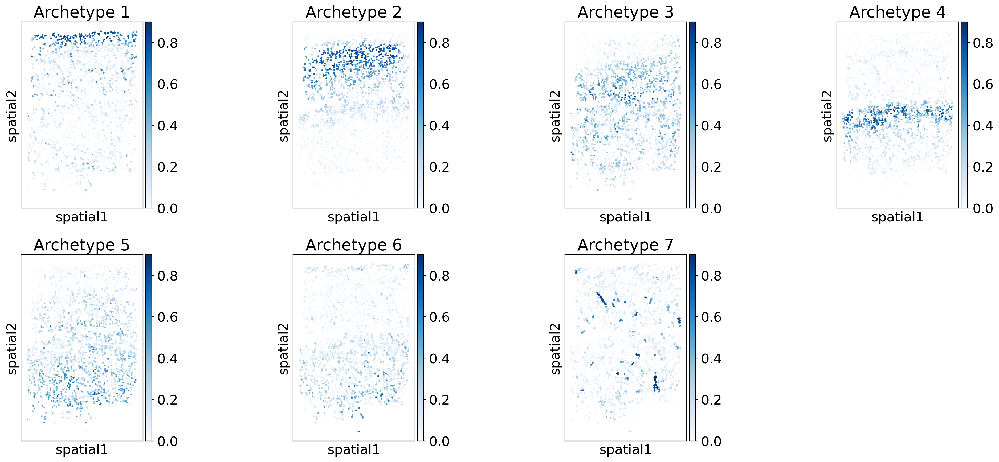

In [20]:
adata_mtg.obsm['S'] = pd.DataFrame(S[:,[0,5,1,4,6,3,2]],columns = ['Archetype ' + str(i+1) for i in range(S.shape[1])],index=adata_mtg.obs_names)
tt = ['Archetype ' + str(i+1) for i in range(S.shape[1])]
sc.pl.spatial(sq.pl.extract(adata_mtg[adata_mtg.obs['batch']==adata_mtg.obs['batch'].unique()[0]],'S'),color=tt,vmax=0.9,spot_size=40,cmap='Blues',wspace=0,show=False)
plt.tight_layout()

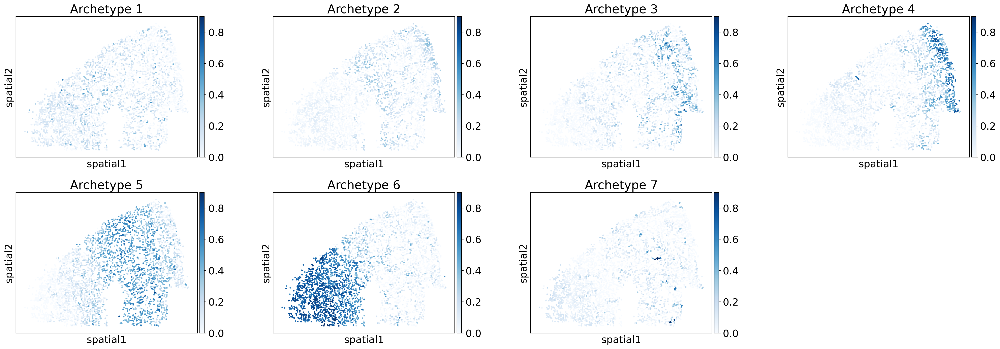

In [21]:
sc.pl.spatial(sq.pl.extract(adata_mtg[adata_mtg.obs['batch']==adata_mtg.obs['batch'].unique()[1]],'S'),color=tt,vmax=0.9,spot_size=40,cmap='Blues',wspace=0.2)

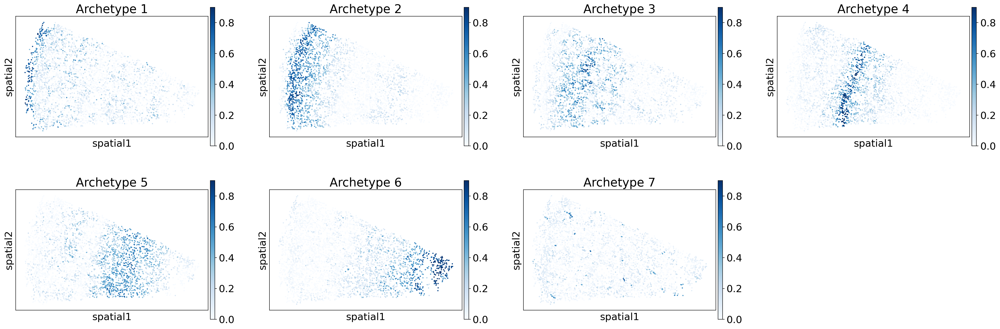

In [22]:
sc.pl.spatial(sq.pl.extract(adata_mtg[adata_mtg.obs['batch']==adata_mtg.obs['batch'].unique()[2]],'S'),color=tt,vmax=0.9,spot_size=40,cmap='Blues',wspace=0.2)

In [10]:
adata_mtg_ = adata_mtg.copy()
sc.pp.highly_variable_genes(adata_mtg_,n_top_genes=1000)
adata_mtg_ = adata_mtg_[:,adata_mtg_.var['means']>0.1]
adata_mtg_

View of AnnData object with n_obs × n_vars = 11059 × 1561
    obs: 'name', 'global.x', 'global.y', 'adjusted.x', 'adjusted.y', 'fov.x', 'fov.y', 'cluster_L1', 'cluster_L2', 'cluster_L3', 'batch', 'coord', 'niche', '_scvi_batch', '_scvi_labels'
    var: 'r2_z', 'r2_s', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'niche_colors', 'neighbors', 'umap', 'cluster_L1_colors', 'batch_colors', 'log1p', 'hvg'
    obsm: 'spatial', 'simvi_z', 'simvi_s', 'X_umap', 'S'
    obsp: 'distances', 'connectivities'

/tmp/ipykernel_92204/3052341457.py:7: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_mtg_.var['class'] = 'Others'
/tmp/ipykernel_92204/3052341457.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_mtg_.var['class'][adata_mtg_.var['r2_z']>0.6] = 'Intrinsic-specific'
/tmp/ipykernel_92204/3052341457.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_mtg_.var['class'][np.abs(adata_mtg_.var['r2_s'].values - hr.predict(adata_mtg_.var['r2_z'].values.reshape(-1,1)) ) / hr.scale_ > 10] = 'Spatial-induced'


Text(0.5, 1.0, '')

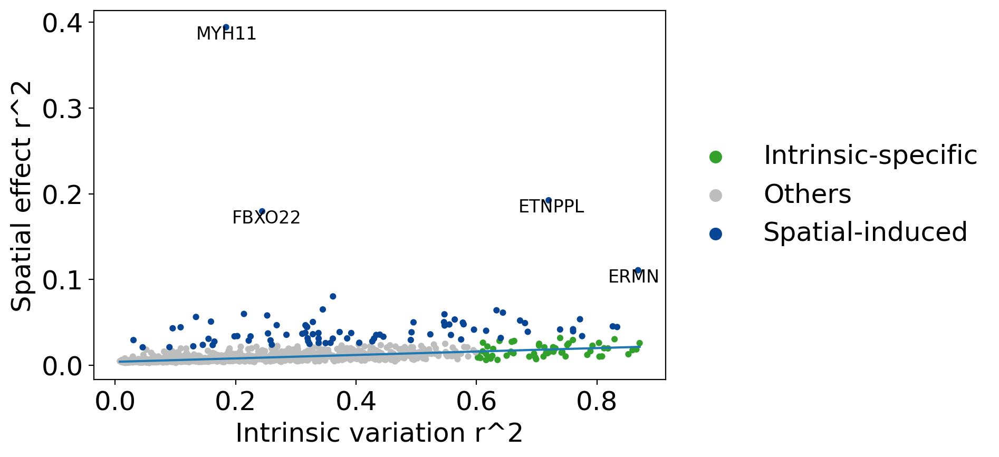

In [11]:
from sklearn.linear_model import HuberRegressor

hr = HuberRegressor()
hr.fit(adata_mtg_.var['r2_z'].values.reshape(-1,1),adata_mtg_.var['r2_s'].values)


adata_mtg_.var['class'] = 'Others'

adata_mtg_.var['class'][adata_mtg_.var['r2_z']>0.6] = 'Intrinsic-specific'
adata_mtg_.var['class'][np.abs(adata_mtg_.var['r2_s'].values - hr.predict(adata_mtg_.var['r2_z'].values.reshape(-1,1)) ) / hr.scale_ > 10] = 'Spatial-induced'

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18

adata_mtg_.uns['class_colors'] = ['#33a02c','#bdbdbd','#084594']



sc.pl.scatter(adata_mtg_.copy(),x='r2_z',y='r2_s',show=False,color='class')
plt.plot(adata_mtg_.var['r2_z'].values[np.argsort(adata_mtg_.var['r2_z'].values)],hr.predict(adata_mtg_.var['r2_z'].values.reshape(-1,1))[np.argsort(adata_mtg_.var['r2_z'].values)])

for i in range(adata_mtg_.var['r2_s'].shape[0]):
    if adata_mtg_.var['r2_s'][i] > 0.082:
        plt.text(adata_mtg_.var['r2_z'][i]-0.05,adata_mtg_.var['r2_s'][i]-0.014,adata_mtg_.var_names[i],fontsize=12)
        
plt.xlabel('Intrinsic variation r^2')
plt.ylabel('Spatial effect r^2')
plt.title('')

In [12]:
1

1